In [1]:
from load import load_all_sis_data
import numpy as np

# Load all data into data cube
all_flux_data, datetime_values, element_mapping = load_all_sis_data('flux_2014/')

print("All data shape:", all_flux_data.shape)
print("Element Mapping:", element_mapping, "\n")

# Precompute the Q1 values for each element
energy_level_to_compute = 1
q1_values = {}
for element_name, element_index in element_mapping.items():
    valid_data_mask = (all_flux_data[energy_level_to_compute - 1, :, element_index] != -999.9) & (all_flux_data[energy_level_to_compute - 1, :, element_index] != 0)
    element_flux_for_stats = all_flux_data[energy_level_to_compute - 1, :, element_index][valid_data_mask]
    if len(element_flux_for_stats) > 0:
        q1_values[element_name] = np.percentile(element_flux_for_stats, 25)

# multiplier for He and O to account for abundance
q1_values["He"] *= 3
q1_values["O"] *= 2.25
print("Q1 Cutoffs: ", q1_values)

# These values will be used as the lower cutoff for decay event identification
he_flux_threshold = q1_values["He"]

All data shape: (8, 91608, 6)
Element Mapping: {'C': 0, 'Fe': 1, 'He': 2, 'N': 3, 'O': 4, 'Si': 5} 

Q1 Cutoffs:  {'C': 8.3286e-06, 'Fe': 3.5479e-06, 'He': 8.335800000000001e-05, 'N': 7.4143e-06, 'O': 1.522125e-05, 'Si': 4.9786e-06}



---

The `compute_decay_events_for_all_data` function utilizes the `identify_exponential_decays` function to find decay events within the entire data range (2014 to 2024) based on Helium flux at an energy level defined by `energy_level_to_compute`. The computed event windows are then stored in a Pandas dataframe. Keeps only events that are longer than the defined hours **and** where the helium (reference) flux stays above the threshold for the specified duration, then disregards the rest.

Then, for each of the other elements, the `count_elements_decaying_in_window` function determines whether or not it is also decaying within the event window, and appends two columns to the dataframe.

Currently, `he_flux_threshold` is defined as 3 times the Q1 upper bound for helium flux data

In [3]:
import pandas as pd
from identification import compute_decay_events_for_all_data

# Define parameters for decay detection and event counting
energy_level_to_compute = 1
min_duration_hours = 48
window_size = 24  # hours for detecting decays in He flux
window_size_for_decay_count = 18  # hours for counting decaying elements
slope_threshold = -0.005
r_value_threshold = 0.0

# Compute decay events using the defined parameters
decay_events_df = compute_decay_events_for_all_data(all_flux_data, datetime_values, element_mapping, energy_level_to_compute, he_flux_threshold, min_duration_hours, window_size, window_size_for_decay_count, slope_threshold, r_value_threshold)

# Fix columns from wrapping
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 1000)
pd.set_option('display.colheader_justify', 'center')

# Print and save the decay events DataFrame
print(decay_events_df)
decay_events_df.to_csv('transformed_data/uncleaned_decay_events_14.csv', index=False)

     Event Number  Start Year  End Year  Start Fractional Day  End Fractional Day  Start Hour  End Hour   Elements Decaying Non-Decaying Elements
0           1         2014       2014           1.000000             4.958333        0.000000  23.000000          1            [C, Si, Fe, N, O] 
1           3         2014       2014           8.833333            20.750000       20.000000  18.000000          6                           [] 
2           4         2014       2014          21.333322            25.041667        7.999722   1.000000          1            [C, Si, Fe, N, O] 
3           5         2014       2014          25.541655            29.291667       12.999722   7.000000          1            [C, Si, Fe, N, O] 
4           7         2014       2014          35.833333            39.499988       20.000000  11.999722          1            [C, Si, Fe, N, O] 
..            ...         ...       ...                   ...                 ...         ...        ...                ... 

Next, we filter by events that have at least 4/6 elements decaying or more

In [6]:
def filter_by_elements_decaying(decay_events_df, min_elements_decaying_list):
    # Filter the DataFrame based on any of the minimum thresholds
    filtered_df = decay_events_df[decay_events_df['Elements Decaying'].isin(min_elements_decaying_list)]

    # Reset the index of the filtered DataFrame
    filtered_df = filtered_df.reset_index(drop=True)
    return filtered_df

min_elements_decaying_list = [4,5,6]  # Set the thresholds for elements decaying
filtered_df = filter_by_elements_decaying(decay_events_df, min_elements_decaying_list)

print(filtered_df)
filtered_df.to_csv('transformed_data/filtered_decay_events.csv', index=False)


    Event Number  Start Year  End Year  Start Fractional Day  End Fractional Day  Start Hour  End Hour   Elements Decaying Non-Decaying Elements
0          3         2014       2014           8.833333            20.750000       20.000000  18.000000          6                      []      
1         12         2014       2014          59.458333            74.833333       11.000000  20.000000          6                      []      
2         18         2014       2014         109.625000           117.875000       15.000000  21.000000          4                [Fe, Si]      
3         29         2014       2014         250.750000           254.083333       18.000000   2.000000          4                [Fe, Si]      
4         30         2014       2014         255.041667           263.416655        1.000000   9.999722          4                 [N, Si]      
5         40         2014       2014         306.000000           312.791655        0.000000  18.999722          5                

---
**Code below is work in progress**

This code segment attempts to classify decay events into three categories: 'Exponential Decay,' 'Power-Law Decay,' and 'Irregular Decay.' 

It works by dividing the data into three predefined segments: 'Front Half,' 'Back Half,' and 'All,' and analyzing the flux data within each segment. 

The code fits a linear regression on both a log linear and log log transformation of the data and calculates the correlation (R-value) for each segment. It selects the best-fitting segment based on the highest absolute R-value and classifies the decay type accordingly. The classification results, along with the best R-values and the associated segment types, are stored in the dataframe.



In [7]:
import numpy as np
import pandas as pd
from scipy.stats import linregress
from scipy.ndimage import gaussian_filter1d

def classify_decay_events(decay_events_df, data_3d, datetime_values, element_mapping, energy_level):
    def log_transform_y(flux, time):
        log_flux = np.log10(flux)
        return time, log_flux

    def log_transform_xy(flux, time):
        log_flux = np.log10(flux)
        time_numeric = np.array([(t - pd.Timestamp("1970-01-01")).total_seconds() for t in time])
        log_time = np.log10((time_numeric - time_numeric[0]) / 3600 + 1)
        return log_time, log_flux

    def fit_linear_model(x, y):
        slope, intercept, r_value, p_value, std_err = linregress(x, y)
        if slope > 0:
            r_value = 0  # Ignore positive slopes by setting R-value to 0
        return slope, intercept, r_value, p_value, std_err

    def classify_decay(log_y_r_value, log_log_r_value):
        if abs(log_y_r_value) < 0.85 and abs(log_log_r_value) < 0.85:
            return 'Irregular Decay'
        elif abs(log_y_r_value) > abs(log_log_r_value):
            return 'Exponential Decay'
        else:
            return 'Power-Law Decay'

    classifications = []
    best_log_y_r_values = []
    best_log_log_r_values = []
    best_log_y_window = []
    best_log_log_window = []

    for index, row in decay_events_df.iterrows():
        start_time = pd.Timestamp(row['Start Year'], 1, 1) + pd.Timedelta(days=row['Start Fractional Day'] - 1) + pd.Timedelta(hours=row['Start Hour'])
        end_time = pd.Timestamp(row['End Year'], 1, 1) + pd.Timedelta(days=row['End Fractional Day'] - 1) + pd.Timedelta(hours=row['End Hour'])
        time_mask = (datetime_values >= start_time) & (datetime_values <= end_time)

        he_flux = data_3d[energy_level - 1, time_mask, element_mapping['He']]
        he_time = datetime_values[time_mask]

        valid_data_mask = he_flux != -999.9
        he_flux = he_flux[valid_data_mask]
        he_time = he_time[valid_data_mask]

        if len(he_flux) == 0:
            classifications.append('No Valid Data')
            best_log_y_r_values.append(np.nan)
            best_log_log_r_values.append(np.nan)
            best_log_y_window.append('N/A')
            best_log_log_window.append('N/A')
            continue

        mid_point = len(he_flux) // 2
        time_windows = [
            (0, mid_point, 'Front Half'),
            (mid_point, len(he_flux), 'Back Half'),
            (0, len(he_flux), 'All')
        ]

        best_log_y_r_value = 0
        best_log_log_r_value = 0
        best_log_y_window_type = ''
        best_log_log_window_type = ''

        for start, end, window_type in time_windows:
            flux_window = he_flux[start:end]
            time_window = he_time[start:end]

            # Log-transform y-axis
            time_log_y, flux_log_y = log_transform_y(flux_window, time_window)
            _, _, r_value_log_y, _, _ = fit_linear_model(np.arange(len(flux_log_y)), flux_log_y)

            # Log-transform x and y axes
            time_log_log, flux_log_log = log_transform_xy(flux_window, time_window)
            _, _, r_value_log_log, _, _ = fit_linear_model(time_log_log, flux_log_log)

            if abs(r_value_log_y) > abs(best_log_y_r_value):
                best_log_y_r_value = r_value_log_y
                best_log_y_window_type = window_type

            if abs(r_value_log_log) > abs(best_log_log_r_value):
                best_log_log_r_value = r_value_log_log
                best_log_log_window_type = window_type

        classification = classify_decay(best_log_y_r_value, best_log_log_r_value)
        classifications.append(classification)
        best_log_y_r_values.append(best_log_y_r_value)
        best_log_log_r_values.append(best_log_log_r_value)
        best_log_y_window.append(best_log_y_window_type)
        best_log_log_window.append(best_log_log_window_type)

    decay_events_df['Decay Type'] = classifications
    decay_events_df['Best Log-Y R-value'] = best_log_y_r_values
    decay_events_df['Best Log-Log R-value'] = best_log_log_r_values
    decay_events_df['Best Log-Y Window'] = best_log_y_window
    decay_events_df['Best Log-Log Window'] = best_log_log_window
    return decay_events_df

classified_decay_events_df = classify_decay_events(filtered_df, all_flux_data, datetime_values, element_mapping, energy_level_to_compute)

print(classified_decay_events_df)
# classified_decay_events_df.to_csv('transformed_data/classified_decay_events.csv', index=False)


C:\Users\jeffr\AppData\Local\Temp\ipykernel_2324\885307912.py:8: RuntimeWarning: divide by zero encountered in log10
  log_flux = np.log10(flux)
c:\Users\jeffr\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
C:\Users\jeffr\AppData\Local\Temp\ipykernel_2324\885307912.py:12: RuntimeWarning: divide by zero encountered in log10
  log_flux = np.log10(flux)


    Event Number  Start Year  End Year  Start Fractional Day  End Fractional Day  Start Hour  End Hour   Elements Decaying Non-Decaying Elements     Decay Type      Best Log-Y R-value  Best Log-Log R-value Best Log-Y Window Best Log-Log Window
0          3         2014       2014           8.833333            20.750000       20.000000  18.000000          6                      []        Exponential Decay      -0.986620            -0.920191           Front Half                All    
1         12         2014       2014          59.458333            74.833333       11.000000  20.000000          6                      []        Exponential Decay      -0.991733            -0.904949           Front Half                All    
2         18         2014       2014         109.625000           117.875000       15.000000  21.000000          4                [Fe, Si]          Power-Law Decay      -0.889087            -0.978947           Front Half         Front Half    
3         29         201

---
**Code below is work in progress**

This code also classifies decay events into 'Exponential Decay,' 'Power-Law Decay,' and 'Irregular Decay,' but uses a sliding window approach instead of predefined segments. 

The window size is half of the data length, and the code iterates through the data, analyzing different overlapping windows. For each window, it performs linear regression on log-transformed flux data and calculates the R-values. 

The code identifies the window with the best-fitting R-value and stores the exact start and end times of that window. The decay type classification is based on these best R-values, and the results are stored in the dataframe along with the specific window times that provided the best fit.









In [9]:
import numpy as np
import pandas as pd
from scipy.stats import linregress
from scipy.ndimage import gaussian_filter1d

def classify_decay_events(decay_events_df, data_3d, datetime_values, element_mapping, energy_level):
    def log_transform_y(flux, time):
        log_flux = np.log10(flux)
        return time, log_flux

    def log_transform_xy(flux, time):
        log_flux = np.log10(flux)
        time_numeric = np.array([(t - pd.Timestamp("1970-01-01")).total_seconds() for t in time])
        log_time = np.log10((time_numeric - time_numeric[0]) / 3600 + 1)
        return log_time, log_flux

    def fit_linear_model(x, y):
        slope, intercept, r_value, p_value, std_err = linregress(x, y)
        if slope > 0:
            r_value = 0  # Ignore positive slopes by setting R-value to 0
        return slope, intercept, r_value, p_value, std_err

    def classify_decay(log_y_r_value, log_log_r_value):
        if abs(log_y_r_value) < 0.85 and abs(log_log_r_value) < 0.85:
            return 'Irregular Decay'
        elif abs(log_y_r_value) > abs(log_log_r_value):
            return 'Exponential Decay'
        else:
            return 'Power-Law Decay'

    classifications = []
    best_log_y_r_values = []
    best_log_log_r_values = []
    best_log_y_window_times = []
    best_log_log_window_times = []

    for index, row in decay_events_df.iterrows():
        start_time = pd.Timestamp(row['Start Year'], 1, 1) + pd.Timedelta(days=row['Start Fractional Day'] - 1) + pd.Timedelta(hours=row['Start Hour'])
        end_time = pd.Timestamp(row['End Year'], 1, 1) + pd.Timedelta(days=row['End Fractional Day'] - 1) + pd.Timedelta(hours=row['End Hour'])
        time_mask = (datetime_values >= start_time) & (datetime_values <= end_time)

        he_flux = data_3d[energy_level - 1, time_mask, element_mapping['He']]
        he_time = datetime_values[time_mask]

        valid_data_mask = he_flux != -999.9
        he_flux = he_flux[valid_data_mask]
        he_time = he_time[valid_data_mask]

        if len(he_flux) == 0:
            classifications.append('No Valid Data')
            best_log_y_r_values.append(np.nan)
            best_log_log_r_values.append(np.nan)
            best_log_y_window_times.append(('N/A', 'N/A'))
            best_log_log_window_times.append(('N/A', 'N/A'))
            continue

        window_size = len(he_flux) // 2  # Half the data window size
        best_log_y_r_value = 0
        best_log_log_r_value = 0
        best_log_y_window_times_current = (None, None)
        best_log_log_window_times_current = (None, None)

        for i in range(len(he_flux) - window_size + 1):
            flux_window = he_flux[i:i + window_size]
            time_window = he_time[i:i + window_size]

            # Log-transform y-axis
            time_log_y, flux_log_y = log_transform_y(flux_window, time_window)
            _, _, r_value_log_y, _, _ = fit_linear_model(np.arange(len(flux_log_y)), flux_log_y)

            # Log-transform x and y axes
            time_log_log, flux_log_log = log_transform_xy(flux_window, time_window)
            _, _, r_value_log_log, _, _ = fit_linear_model(time_log_log, flux_log_log)

            if abs(r_value_log_y) > abs(best_log_y_r_value):
                best_log_y_r_value = r_value_log_y
                best_log_y_window_times_current = (time_window[0], time_window[-1])

            if abs(r_value_log_log) > abs(best_log_log_r_value):
                best_log_log_r_value = r_value_log_log
                best_log_log_window_times_current = (time_window[0], time_window[-1])

        classification = classify_decay(best_log_y_r_value, best_log_log_r_value)
        classifications.append(classification)
        best_log_y_r_values.append(best_log_y_r_value)
        best_log_log_r_values.append(best_log_log_r_value)
        best_log_y_window_times.append(best_log_y_window_times_current)
        best_log_log_window_times.append(best_log_log_window_times_current)

    decay_events_df['Decay Type'] = classifications
    decay_events_df['Best Log-Y R-value'] = best_log_y_r_values
    decay_events_df['Best Log-Log R-value'] = best_log_log_r_values
    decay_events_df['Best Log-Y Window Times'] = best_log_y_window_times
    decay_events_df['Best Log-Log Window Times'] = best_log_log_window_times
    return decay_events_df

classified_decay_events_df = classify_decay_events(filtered_df, all_flux_data, datetime_values, element_mapping, energy_level_to_compute)

print(classified_decay_events_df)
# classified_decay_events_df.to_csv('transformed_data/classified_decay_events.csv', index=False)


C:\Users\jeffr\AppData\Local\Temp\ipykernel_2324\4117617024.py:8: RuntimeWarning: divide by zero encountered in log10
  log_flux = np.log10(flux)
c:\Users\jeffr\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
C:\Users\jeffr\AppData\Local\Temp\ipykernel_2324\4117617024.py:12: RuntimeWarning: divide by zero encountered in log10
  log_flux = np.log10(flux)


    Event Number  Start Year  End Year  Start Fractional Day  End Fractional Day  Start Hour  End Hour   Elements Decaying Non-Decaying Elements     Decay Type      Best Log-Y R-value  Best Log-Log R-value Best Log-Y Window Best Log-Log Window              Best Log-Y Window Times                           Best Log-Log Window Times             
0          3         2014       2014           8.833333            20.750000       20.000000  18.000000          6                      []        Exponential Decay      -0.986620            -0.963665           Front Half                All      (2014-01-09 17:00:00.079201, 2014-01-15 14:00:...  (2014-01-13 18:00:00.099359, 2014-01-19 15:00:...
1         12         2014       2014          59.458333            74.833333       11.000000  20.000000          6                      []        Exponential Decay      -0.991733            -0.951276           Front Half                All      (2014-02-28 22:00:00.154083, 2014-03-08 17:59:...  (2014-03-04 

---
**Modified graphing functions below with attempts to fit lines. Currently they don't really work very well.**

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


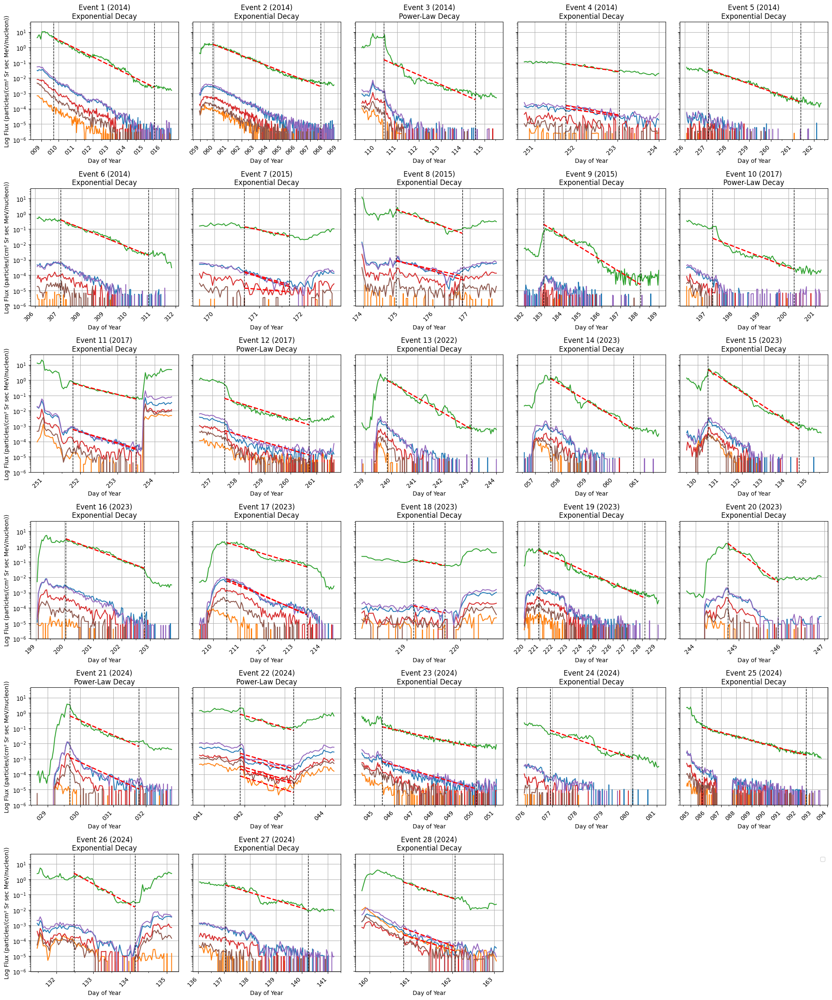

In [35]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np
import pandas as pd

def plot_classified_decay_events(decay_events_df, data_3d, datetime_values, element_mapping, energy_level, extend_days):
    num_events = len(decay_events_df)
    if num_events == 0:
        print("No decay events found to plot.")
        return

    num_cols = 5
    num_rows = int(np.ceil(num_events / num_cols))

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 4 * num_rows), sharey=True)
    fig.subplots_adjust(hspace=0.5, top=0.95)

    for i, row in decay_events_df.iterrows():
        ax = axes[i // num_cols, i % num_cols]

        # Use best start and stop times for plotting
        best_log_y_window_times = row['Best Log-Y Window Times']
        best_log_log_window_times = row['Best Log-Log Window Times']

        if row['Decay Type'] == 'Exponential Decay':
            best_start_time, best_end_time = best_log_y_window_times
        else:
            best_start_time, best_end_time = best_log_log_window_times

        if pd.isnull(best_start_time) or pd.isnull(best_end_time):
            # No valid data for this event
            ax.text(0.5, 0.5, 'No Valid Data', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
            ax.axis('off')
            continue

        best_start_time = pd.to_datetime(best_start_time)
        best_end_time = pd.to_datetime(best_end_time)

        # Extend time window for context
        extended_start_time = best_start_time - pd.Timedelta(days=extend_days)
        extended_end_time = best_end_time + pd.Timedelta(days=extend_days)

        time_mask = (datetime_values >= extended_start_time) & (datetime_values <= extended_end_time)

        for element, index in element_mapping.items():
            element_flux = data_3d[energy_level - 1, time_mask, index]
            element_time = datetime_values[time_mask]

            valid_data_mask = element_flux != -999.9
            element_flux = element_flux[valid_data_mask]
            element_time = element_time[valid_data_mask]

            ax.plot(element_time, element_flux, label=element)

            # Plot best fit line within the best window
            fit_mask = (element_time >= best_start_time) & (element_time <= best_end_time)
            fit_time = element_time[fit_mask]
            fit_flux = element_flux[fit_mask]

            if len(fit_time) > 1:  # Ensure there's enough data for fitting
                if row['Decay Type'] == 'Exponential Decay':
                    log_flux = np.log10(fit_flux)
                    coeffs = np.polyfit(mdates.date2num(fit_time), log_flux, 1)
                    poly = np.poly1d(coeffs)
                    ax.plot(fit_time, 10**poly(mdates.date2num(fit_time)), color='red', linestyle='--', linewidth=2, label=f'Best Fit ({element})')
                elif row['Decay Type'] == 'Power-Law Decay':
                    log_time = np.log10((mdates.date2num(fit_time) - mdates.date2num(fit_time)[0]) / 3600 + 1)
                    log_flux = np.log10(fit_flux)
                    coeffs = np.polyfit(log_time, log_flux, 1)
                    poly = np.poly1d(coeffs)
                    ax.plot(fit_time, 10**poly(np.log10((mdates.date2num(fit_time) - mdates.date2num(fit_time)[0]) / 3600 + 1)), 
                            color='red', linestyle='--', linewidth=2, label=f'Best Fit ({element})')


        ax.set_yscale("log")
        ax.set_xlabel("Day of Year")

        if i % num_cols == 0:
            ax.set_ylabel("Log Flux (particles/(cm² Sr sec MeV/nucleon))")
        ax.set_title(f"Event {i+1} ({best_start_time.year})\n{row['Decay Type']}")
        ax.grid(True)

        ax.xaxis.set_major_locator(mdates.DayLocator())
        ax.xaxis.set_major_formatter(mdates.DateFormatter("%j"))
        ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=12))
        plt.setp(ax.get_xticklabels(), rotation=45, ha="right")

        ax.axvline(best_start_time, color="black", linestyle="--", linewidth=1)
        ax.axvline(best_end_time, color="black", linestyle="--", linewidth=1)

    # Hide any unused subplots in the grid
    for j in range(i+1, num_rows * num_cols):
        axes[j // num_cols, j % num_cols].axis('off')

    plt.tight_layout()
    plt.legend()
    plt.show()

plot_classified_decay_events(classified_decay_events_df, all_flux_data, datetime_values, element_mapping, energy_level_to_compute, extend_days=1)


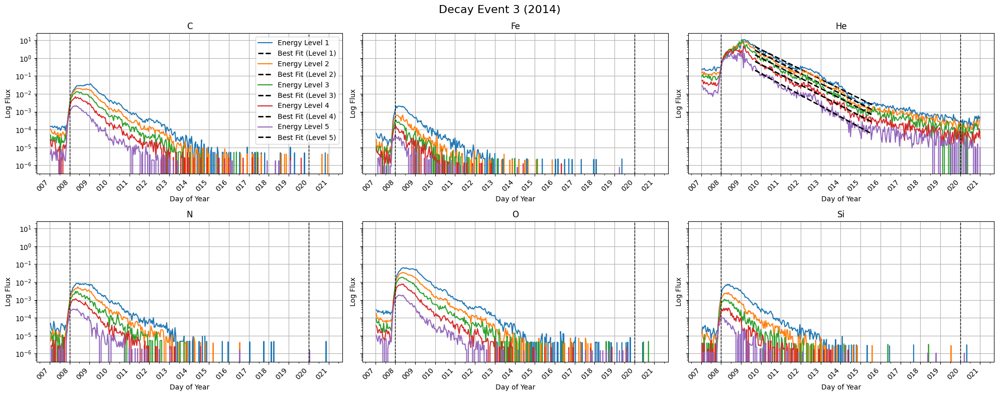

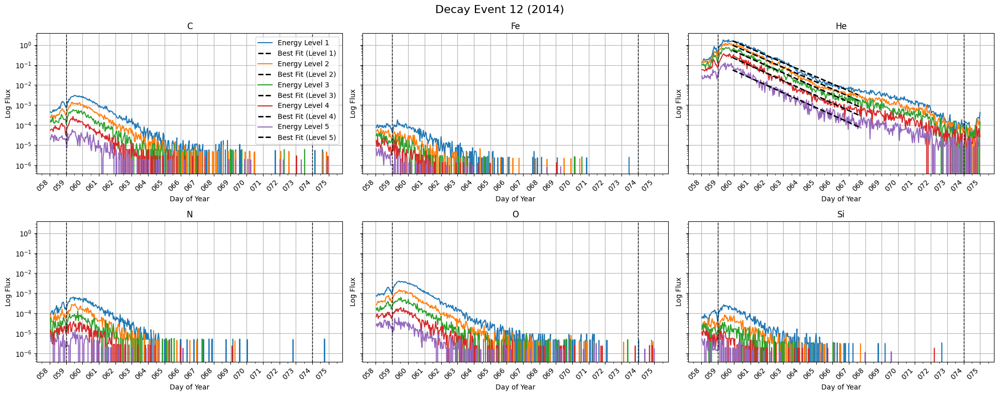

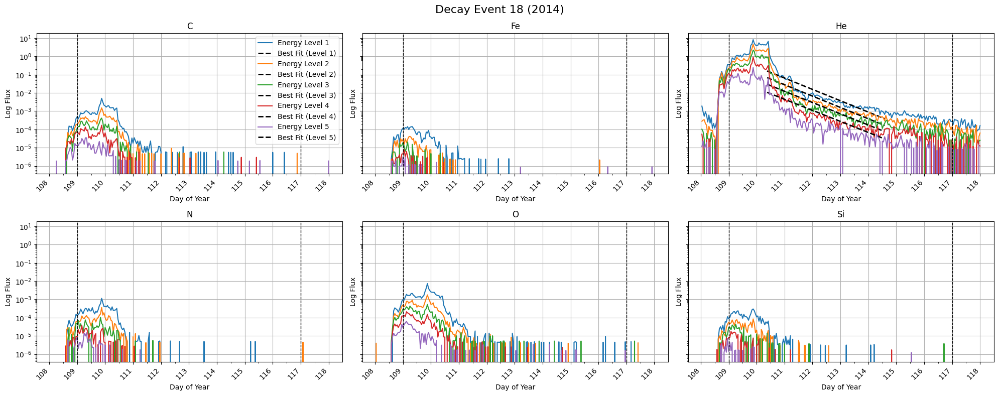

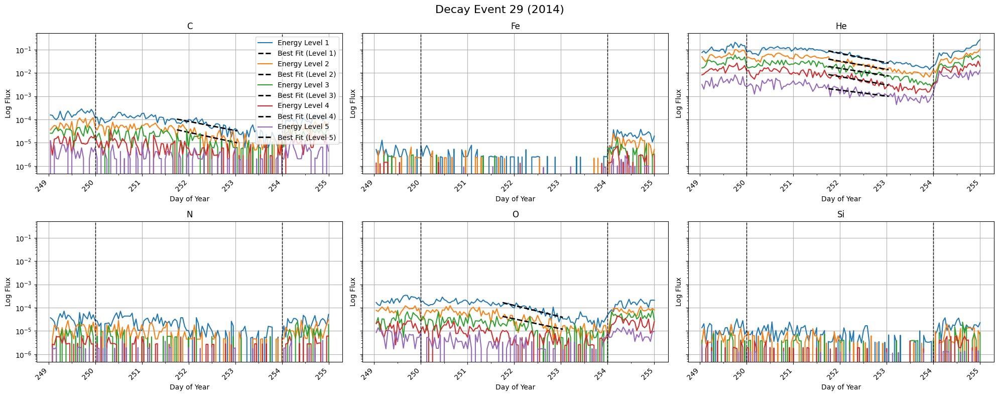

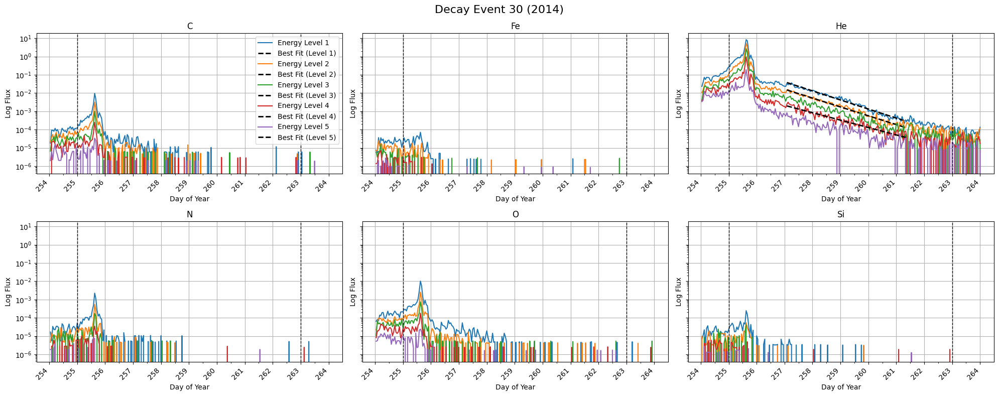

...

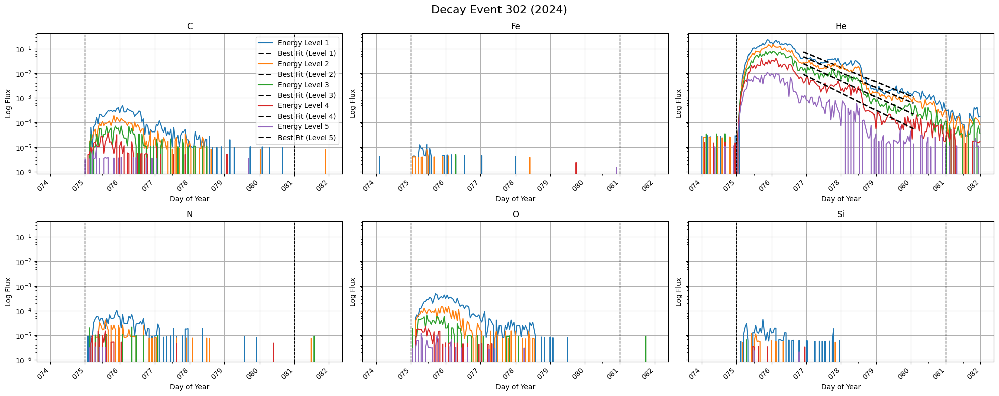

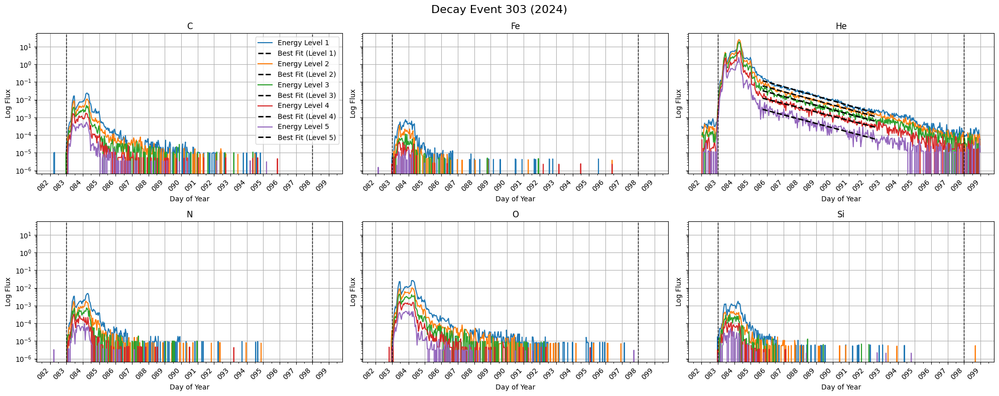

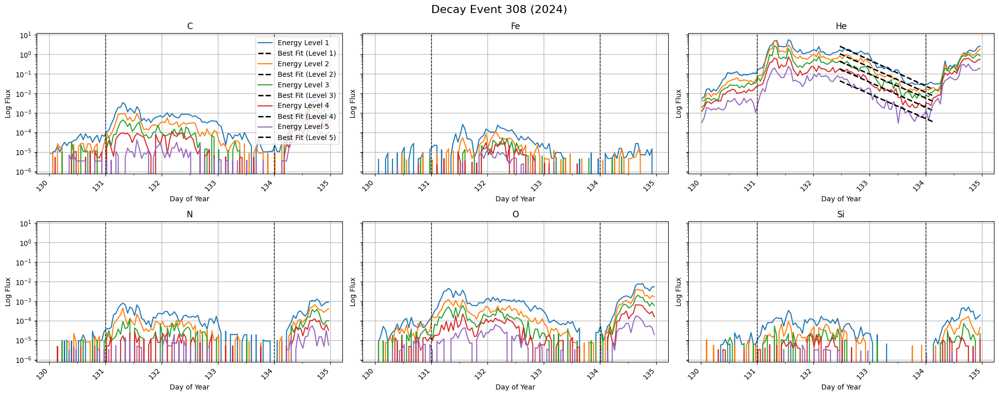

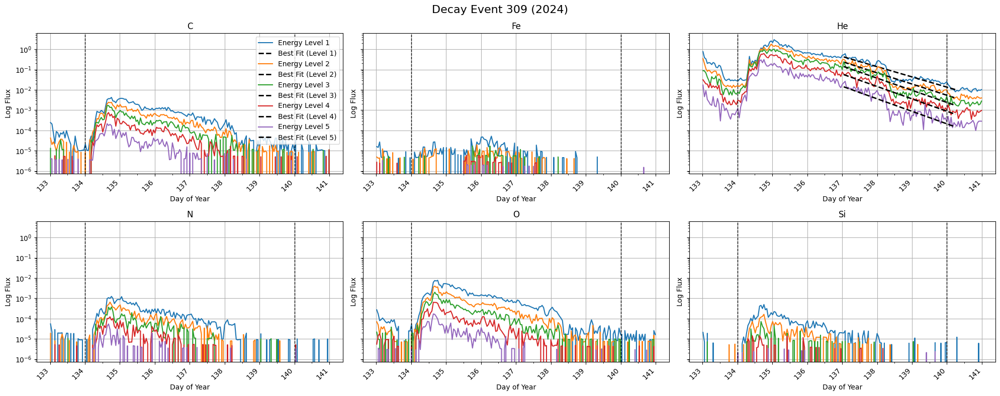

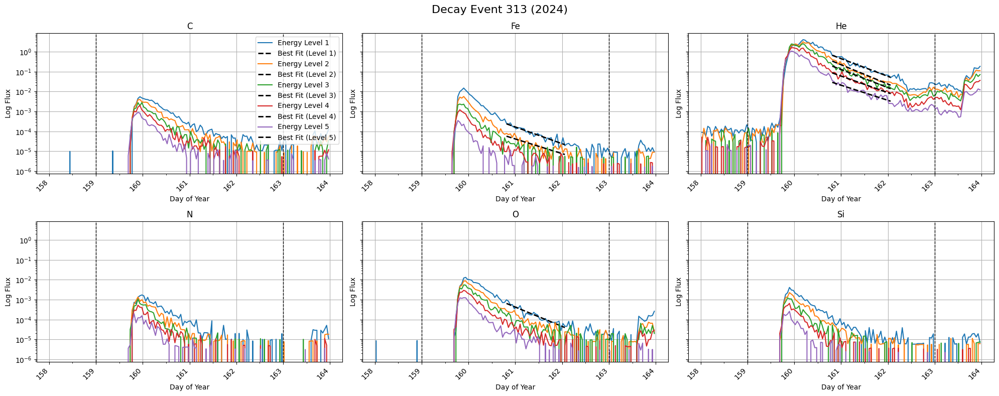

In [47]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np
import pandas as pd

def plot_decay_events_per_element(decay_events_df, data_3d, datetime_values, element_mapping, energy_levels, extend_days, useLogScale):
    """
    Args:
        decay_events_df (pd.DataFrame): DataFrame containing decay event details.
        data_3d (numpy.ndarray): The 3D data cube (energy, time, element).
        datetime_values (numpy.ndarray): Array of datetime objects for the time axis.
        element_mapping (dict): Dictionary mapping element names to array indices.
        energy_levels (int): Number of energy levels to analyze (starting from the lowest).
        extend_days (int): Number of days to extend the time range before and after the event.
        useLogScale (bool): Whether to use a logarithmic scale for the y-axis.
    """
    
    for idx, row in decay_events_df.iterrows():
        event_number = row["Event Number"]
        
        start_time = pd.to_datetime(f"{int(row['Start Year'])}-{row['Start Fractional Day']:.5f}", format="%Y-%j.%f")
        end_time = pd.to_datetime(f"{int(row['End Year'])}-{row['End Fractional Day']:.5f}", format="%Y-%j.%f")

        extended_start_time = start_time - pd.Timedelta(days=extend_days)
        extended_end_time = end_time + pd.Timedelta(days=extend_days)
        
        time_mask = (datetime_values >= extended_start_time) & (datetime_values <= extended_end_time)
        
        num_elements = len(element_mapping)
        num_cols = 3
        num_rows = int(np.ceil(num_elements / num_cols))
        
        fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 4 * num_rows), sharey=True)
        fig.subplots_adjust(hspace=0.5, top=0.95)
        axes = axes.flatten()

        for i, (element_name, element_index) in enumerate(element_mapping.items()):

            # if element_name != 'He':
            #     continue
            ax = axes[i]
            
            for level in range(energy_levels):
                element_flux = data_3d[level, time_mask, element_index]
                valid_data_mask = element_flux != -999.9
                element_flux = element_flux[valid_data_mask]
                element_time = datetime_values[time_mask][valid_data_mask]
                
                line, = ax.plot(element_time, element_flux, label=f"Energy Level {level+1}")
                
                # Plot best fit line within the best window
                best_log_y_window_times = row['Best Log-Y Window Times']
                best_log_log_window_times = row['Best Log-Log Window Times']

                if row['Decay Type'] == 'Exponential Decay':
                    best_start_time, best_end_time = best_log_y_window_times
                else:
                    best_start_time, best_end_time = best_log_log_window_times

                if pd.isnull(best_start_time) or pd.isnull(best_end_time):
                    continue

                best_start_time = pd.to_datetime(best_start_time)
                best_end_time = pd.to_datetime(best_end_time)

                fit_mask = (element_time >= best_start_time) & (element_time <= best_end_time)
                fit_time = element_time[fit_mask]
                fit_flux = element_flux[fit_mask]

                if len(fit_time) > 1:  # Ensure there's enough data for fitting
                    if row['Decay Type'] == 'Exponential Decay':
                        log_flux = np.log10(fit_flux)
                        coeffs = np.polyfit(mdates.date2num(fit_time), log_flux, 1)
                        poly = np.poly1d(coeffs)
                        ax.plot(fit_time, 10**poly(mdates.date2num(fit_time)), color='black', linestyle='--', linewidth=2, label=f'Best Fit (Level {level+1})')
                    elif row['Decay Type'] == 'Power-Law Decay':
                        log_time = np.log10((mdates.date2num(fit_time) - mdates.date2num(fit_time)[0]) / 3600 + 1)
                        log_flux = np.log10(fit_flux)
                        coeffs = np.polyfit(log_time, log_flux, 1)
                        poly = np.poly1d(coeffs)
                        ax.plot(fit_time, 10**poly(np.log10((mdates.date2num(fit_time) - mdates.date2num(fit_time)[0]) / 3600 + 1)), color='black', linestyle='--', linewidth=2, label=f'Best Fit (Level {level+1})')

            if useLogScale:
                ax.set_yscale("log")
            
            ax.set_xlabel("Day of Year")
            ax.set_ylabel("Log Flux" if useLogScale else "Flux")
            ax.set_title(f"{element_name}")
            ax.grid(True)

            ax.xaxis.set_major_locator(mdates.DayLocator())
            ax.xaxis.set_major_formatter(mdates.DateFormatter("%j"))
            ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=12))
            plt.setp(ax.get_xticklabels(), rotation=45, ha="right")
            ax.axvline(start_time, color="black", linestyle="--", linewidth=1)
            ax.axvline(end_time, color="black", linestyle="--", linewidth=1)
        
        for j in range(i + 1, num_rows * num_cols):
            axes[j].axis('off')
        
        # Add the legend inside the first subplot
        handles, labels = [], []
        for ax in axes[:num_elements]:
            for handle, label in zip(*ax.get_legend_handles_labels()):
                if label not in labels:
                    handles.append(handle)
                    labels.append(label)
        axes[0].legend(handles, labels, loc='upper right', bbox_to_anchor=(1, 1))
        
        fig.suptitle(f"Decay Event {event_number} ({start_time.year})", fontsize=16)
        plt.tight_layout()
        plt.show()

plot_decay_events_per_element(classified_decay_events_df, all_flux_data, datetime_values, element_mapping, energy_levels=5, extend_days=1, useLogScale=True)
